# Imports & prev code

In [92]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.colors import TwoSlopeNorm
import dill as pickle
import random

class Model:
    def __init__(self):
        self.params = {}

    def predict(self, X):
        raise NotImplementedError

    def loss(self, X, y):
        raise NotImplementedError

    def grad(self, X, y):
        raise NotImplementedError

class Optimizer:
    def __init__(self, model):
        self.model = model

    def step(self, grad):
        raise NotImplementedError

class SGD(Optimizer):
    def __init__(self, model, learning_rate=1e-3):
        super().__init__(model)
        self.learning_rate = learning_rate

    def step(self, grad):
        for param in self.model.params:
            self.model.params[param] -= self.learning_rate * grad[param]

## Here's an implementation of ADAM from Jasper if you do not have one yet
class ADAM(Optimizer):
    def __init__(
        self, model: Model, lr: float = 1e-3, b1: float = 0.9, b2: float = 0.999
    ) -> None:
        super().__init__(model)
        self.lr = lr
        self.b1, self.b2 = b1, b2
        self.m1 = {param: 0.0 for param in model.params}
        self.m2 = {param: 0.0 for param in model.params}

    def step(self, grad: dict[str, np.ndarray[np.float64]]) -> None:
        for param in self.model.params:
            self.m1[param] = self.m1[param] * self.b1 + grad[param] * (1 - self.b1)
            self.m2[param] = self.m2[param] * self.b2 + grad[param] ** 2 * (1 - self.b2)
            self.model.params[param] -= (
                self.lr * self.m1[param] / np.sqrt(self.m2[param] + 1e-7)
            )

def grad_check(model, X, y, eps = 1e-6):
    """Numerically estimate the gradient of the loss function and compare it to the analytical gradient"""
    grad = model.grad(X, y)
    for param in model.params:
        print(f"Checking {param}:")
        print(f"Analytical gradient {grad[param]}")
        assert grad[param].shape == model.params[param].shape, "Gradient shape mismatch"
        numgrad = np.zeros(grad[param].shape)
        for i, val in np.ndenumerate(model.params[param]):
            model.params[param][i] = val + eps
            loss1 = model.loss(X, y)
            model.params[param][i] = val - eps
            loss2 = model.loss(X, y)
            model.params[param][i] = val
            numgrad[i] = (loss1 - loss2) / (2 * eps)
        print(f"Numerical gradient {numgrad}")
        print(f"Difference {abs(numgrad - grad[param])}")
        print()

def train(model, X_train, y_train, num_epochs = 50,
          print_every = 1,
          batch_size = None, optimizer = None,
          X_val = None, y_val = None,
          save_path='best_model.pkl'):

    if optimizer is None:
        optimizer = SGD(model)
    if batch_size is None:
        batch_size = X_train.shape[0]

    if X_val is not None:
        best_val_acc = np.mean(model.classify(X_val) == y_val)

    for epoch in range(num_epochs):

        if epoch % print_every == 0:
            print(f"Epoch {epoch}:")
            print(f"Train Loss = {model.loss(X_train, y_train)}")
            print(f"Train Accuracy = {np.mean(model.classify(X_train) == y_train)}")
            if X_val is not None:
                print(f"Val Loss = {model.loss(X_val, y_val)}")
                val_acc = np.mean(model.classify(X_val) == y_val)
                print(f"Val Accuracy = {val_acc}")
                if val_acc > best_val_acc:
                    best_val_acc = val_acc
                    with open(save_path, 'wb') as f:
                        pickle.dump(model, f)

        # split into batches and loop over batches
        indices = np.random.permutation(X_train.shape[0])
        num_batches = X_train.shape[0] // batch_size
        batch_indices = np.array_split(indices, num_batches)
        for batch in batch_indices:
            optimizer.step(model.grad(X_train[batch], y_train[batch]))

# This is my implementation of Linear Classifier
class LinearClassifier(Model):
    def __init__(self, input_dim, output_dim, scale=1, reg=0):
        W = np.zeros((input_dim, output_dim))
        b = np.zeros(output_dim)
        self.params = {'W': W, 'b': b}
        self.reg = reg
        self.scale = scale

    def predict(self, X2):
        X = X2/self.scale
        return X @ self.params['W'] + self.params['b']

    def classify(self, X2):
        X = X2/self.scale
        scores = self.predict(X)
        return np.argmax(scores, axis=1)

    def probs(self, X2):
        X = X2/self.scale
        scores = self.predict(X)
        scores -= np.max(scores, axis=1, keepdims=True) # numerical stability trick
        scores = np.exp(scores)
        return scores / np.sum(scores, axis=1, keepdims=True)

    def loss(self, X2, y, add_reg_term=1):
        X = X2/self.scale
        # cross entropy loss
        probs = self.probs(X)
        loss = -np.log(probs[np.arange(X.shape[0]), y]).mean()
        if add_reg_term:
            loss += self.reg * np.sum(self.params['W'] ** 2)
        return loss

    def grad(self, X2, y):
        X = X2/self.scale
        dscores = self.probs(X)
        dscores[np.arange(X.shape[0]), y] -= 1
        dW = np.dot(X.T, dscores) / X.shape[0]
        dW += 2 * self.reg * self.params['W']
        db = np.sum(dscores, axis=0) / X.shape[0]
        grad = {'W': dW, 'b': db}
        return grad

def plot_2d_data(X, y):
    fig, ax = plt.subplots(figsize = (5, 5))
    ax.scatter(X[:, 0], X[:, 1], c=y, s=40, cmap=plt.cm.Spectral, edgecolors='black')

def plot_2d_classifier(X, y, classifier):
    """Makes a scatter plot of the data points and a background of what the classifier does.
    X is a (n,2) array of data points.
        y is an (n,) array of labels.
        classifier is a function that takes a 2d points
         and gives a label."""
    border = 0.2
    x_min, x_max = X[:, 0].min() - border, X[:, 0].max() + border
    y_min, y_max = X[:, 1].min() - border, X[:, 1].max() + border
    num_points = 100
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, num_points),
                        np.linspace(y_min, y_max, num_points))
    grid_points = np.c_[xx.ravel(), yy.ravel()]
    classes = classifier(grid_points)
    classes = classes.reshape(xx.shape)
    fig = plt.figure(figsize = (6,6))
    plt.contourf(xx, yy, classes, 3, cmap=plt.cm.Spectral, alpha=1)
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, cmap=plt.cm.Spectral, edgecolors='black')
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())

def softmax(arr):
    return (np.e**arr)/np.sum(np.e**arr, axis=1, keepdims=1)

def make_spiral_data(num_points, num_classes, rng_seed = 16, rad_mul = 1, rad_off = 20, mul=[1, 1, 1, 5, 10]):
    random.seed(rng_seed)
    """Generate spiral data."""
    angles = list(np.linspace(0, 360, num_classes+1))
    angles.pop(-1)

    # the 2 below can be tweaked for different sorts of spirals, possibly make them kwargs?
    angl_off = 3 # the more this is, the longer the spiral but more spaced out
    noise = 3 # how much randomness there is

    rng = np.random.default_rng(rng_seed)
    n = num_points*num_classes
    ans = np.zeros((n, 2))
    labels = np.zeros(n, dtype=int)

    for i in range(num_points):
        for j in range(num_classes):
            # the radius and angle of our polar points
            rad = rad_mul*i + rad_off
            angl = angles[j]*np.pi/180

            # convert to cartesian
            y = np.sin(angl)*rad
            x = np.cos(angl)*rad
            offset_x, offset_y = rng.normal(scale=noise)*random.choice(mul), rng.normal(scale=noise)*random.choice(mul)

            # affect ans
            ans[i*num_classes + j][0] = x+offset_x
            ans[i*num_classes + j][1] = y+offset_y
            labels[i*num_classes + j] = j
            angles[j] = (angles[j]+angl_off)%360
    return ans, labels

def visualize_weights(m, num, shap):
    fig, axes = plt.subplots(num//5 + 1, 5, figsize=(100, 500))
    V = np.copy(m.params['W1'])
    for i, ax in enumerate(axes.flat):
        if i >= num: break
        if len(shap) == 2:
            im = ax.imshow(V[:,i].reshape(shap),
                        cmap='RdBu_r',
                        norm=TwoSlopeNorm(vcenter=0))
        else:
            a = V[:,i]
            a[a<0] /= np.min(a)
            a[a>0] /= np.max(a)
            a = a*0.5 + 0.5
            im = ax.imshow(a.reshape(shap),
                        cmap='RdBu_r',
                        norm=TwoSlopeNorm(vcenter=0))
        plt.colorbar(im, ax=ax)
        ax.set_title(f'Weights for {i}')
        # Remove axis numbers
        ax.set_xticks([])
        ax.set_yticks([])
    plt.tight_layout()
    plt.show()

# Part 1: Bring in a very nonlinear 2D dataset to defeat Linear Classifier

Epoch 0:
Train Loss = nan
Train Accuracy = 0.5
Epoch 2:
Train Loss = nan
Train Accuracy = 0.5
Epoch 4:
Train Loss = nan
Train Accuracy = 0.5
Epoch 6:
Train Loss = nan
Train Accuracy = 0.5
Epoch 8:
Train Loss = nan
Train Accuracy = 0.5


/var/folders/d0/dk6cszhs0x5d2_p1gnjcc9r40000gn/T/ipykernel_70607/1730635850.py:135: RuntimeWarning: divide by zero encountered in divide
  X = X2/self.scale
/var/folders/d0/dk6cszhs0x5d2_p1gnjcc9r40000gn/T/ipykernel_70607/1730635850.py:120: RuntimeWarning: invalid value encountered in matmul
  return X @ self.params['W'] + self.params['b']
/var/folders/d0/dk6cszhs0x5d2_p1gnjcc9r40000gn/T/ipykernel_70607/1730635850.py:123: RuntimeWarning: divide by zero encountered in divide
  X = X2/self.scale
/var/folders/d0/dk6cszhs0x5d2_p1gnjcc9r40000gn/T/ipykernel_70607/1730635850.py:144: RuntimeWarning: divide by zero encountered in divide
  X = X2/self.scale
/var/folders/d0/dk6cszhs0x5d2_p1gnjcc9r40000gn/T/ipykernel_70607/1730635850.py:119: RuntimeWarning: divide by zero encountered in divide
  X = X2/self.scale


array([[nan, nan],
       [nan, nan],
       [nan, nan],
       [nan, nan]])

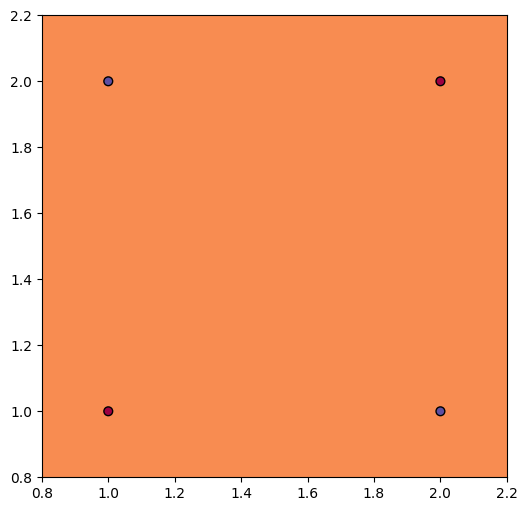

In [49]:
X_tiny = np.array([[1,1],
                  [1,2],
                  [2,1],
                  [2,2]], dtype=float)
y_tiny = np.array([0,1,1,0])
clsfr = LinearClassifier(2, 2, 0)
train(clsfr, X_tiny, y_tiny, 10, 2, optimizer=ADAM(clsfr))
plot_2d_classifier(X_tiny, y_tiny, clsfr.classify)
clsfr.predict(X_tiny)

In [50]:
X_spiral, y_spiral = make_spiral_data(100, 3)

Epoch 0:
Train Loss = nan
Train Accuracy = 0.3333333333333333
Epoch 2:
Train Loss = nan
Train Accuracy = 0.3333333333333333
Epoch 4:
Train Loss = nan
Train Accuracy = 0.3333333333333333
Epoch 6:
Train Loss = nan
Train Accuracy = 0.3333333333333333
Epoch 8:
Train Loss = nan
Train Accuracy = 0.3333333333333333


/var/folders/d0/dk6cszhs0x5d2_p1gnjcc9r40000gn/T/ipykernel_70607/1730635850.py:135: RuntimeWarning: divide by zero encountered in divide
  X = X2/self.scale
/var/folders/d0/dk6cszhs0x5d2_p1gnjcc9r40000gn/T/ipykernel_70607/1730635850.py:120: RuntimeWarning: invalid value encountered in matmul
  return X @ self.params['W'] + self.params['b']
/var/folders/d0/dk6cszhs0x5d2_p1gnjcc9r40000gn/T/ipykernel_70607/1730635850.py:123: RuntimeWarning: divide by zero encountered in divide
  X = X2/self.scale
/var/folders/d0/dk6cszhs0x5d2_p1gnjcc9r40000gn/T/ipykernel_70607/1730635850.py:144: RuntimeWarning: divide by zero encountered in divide
  X = X2/self.scale
/var/folders/d0/dk6cszhs0x5d2_p1gnjcc9r40000gn/T/ipykernel_70607/1730635850.py:119: RuntimeWarning: divide by zero encountered in divide
  X = X2/self.scale


array([[nan, nan, nan],
       [nan, nan, nan],
       [nan, nan, nan],
       [nan, nan, nan]])

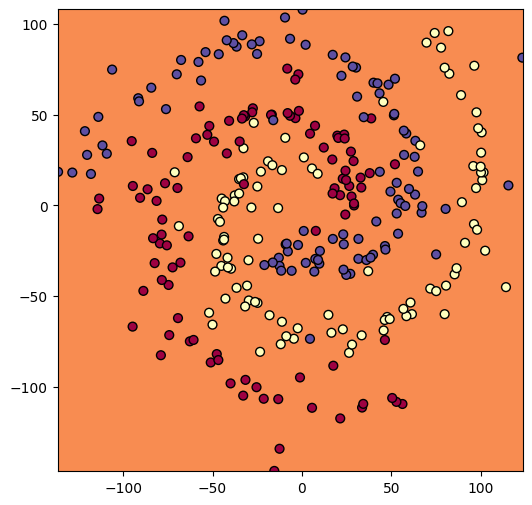

In [51]:
clsfr = LinearClassifier(2, 3, 0)
train(clsfr, X_spiral, y_spiral, 10, 2, optimizer=ADAM(clsfr))
plot_2d_classifier(X_spiral, y_spiral, clsfr.classify)
clsfr.predict(X_tiny)

# 2 Layer Neural Networks

## Code

In [52]:
class Activation():
    def __init__(self) -> None:
        pass
    
    def forward(self, X):
        pass

    def backward(self, X, revX):
        pass

class ReLu(Activation):
    def forward(self, X):
        return np.maximum(0, X)
    def backward(self, X, revX):
        return np.where(X < 0, np.zeros_like(revX), revX)

# class LeakyReLu(Activation):
#     def __init__(self, c=0.01) -> None:
#         super().__init__()
#         self.c = c
#     def forward(self, X):
#         return np.where(X < 0, X*self.c, X)
#     def backward(self, X, revX):
#         return np.where(X < 0, np.ones_like(revX)*self.c, np.ones_like(revX))


class Sigmoid(Activation):
    def forward(self, X):
        return np.tanh(X)
    def backward(self, X, revX):
        return revX * (1-np.tanh(X)**2)


class TwoLayerNeuralNetwork(LinearClassifier):
    def __init__(self, input_dim, hidden_dim, output_dim, activation, reg=0, scale=1, ):
        W1 = np.random.standard_normal((input_dim, hidden_dim)) / np.sqrt(input_dim)
        # b1 = np.random.standard_normal((hidden_dim))
        b1 = np.zeros((hidden_dim))
        W2 = np.random.standard_normal((hidden_dim, output_dim)) / np.sqrt(hidden_dim)
        b2 = np.zeros((output_dim))
        # b2 = np.random.standard_normal((output_dim))
        self.params = {'W1': W1, 'b1': b1, 'W2': W2, 'b2': b2}
        self.activation = activation
        self.reg = reg
        self.scale = scale
    def __getattr__(self, a):
        if a in ["W1", "b1", "W2", "b2"]:
            return self.params[a]
        return super().__getattr__(a)
    
    

    def predict(self, X2):
        X = X2/self.scale
        return self.activation.forward(X@self.W1 + self.b1)@self.W2 + self.b2
    
    def loss(self, X2, y):
        X = X2/self.scale
        l = super().loss(X, y, 0)
        l += self.reg * np.sum(self.W1 ** 2)
        l += self.reg * np.sum(self.W2 ** 2)
        return l
        
    def grad(self, X2, y):
        X = X2/self.scale
        v2 = (X@self.W1 + self.b1)
        dscores = self.probs(X2)
        dscores[np.arange(X.shape[0]), y] -= 1
        dscores /= X.shape[0]
        db2 = np.sum(dscores, axis=0) 
        dW2 = self.activation.forward(v2).T @ dscores
        dPrevLayer = dscores @ self.W2.T 
        dPrevLayer = self.activation.backward(v2, dPrevLayer)
        db1 = np.sum(dPrevLayer, axis=0)
        dW1 = X.T @ dPrevLayer
        
        dW2 += 2 * self.reg * self.W2
        dW1 += 2 * self.reg * self.W1

        grad = {'W2' : dW2, 'b2' : db2, 'W1': dW1, 'b1':db1}
        return grad


## Grad check: works on really tiny data

Checking W1:
Analytical gradient [[-0.00779302 -0.02109053  0.00242496 -0.00250602  0.00863569  0.02479316
   0.00808851 -0.01266305 -0.02298079 -0.01941456]
 [ 0.          0.          0.          0.          0.          0.
   0.          0.          0.          0.        ]]
Numerical gradient [[-0.00779302 -0.02109053  0.00242496 -0.00250602  0.00863569  0.02479316
   0.00808851 -0.01266305 -0.02298079 -0.01941456]
 [ 0.          0.          0.          0.          0.          0.
   0.          0.          0.          0.        ]]
Difference [[1.38438358e-11 4.33356961e-11 3.92649316e-11 2.14199092e-11
  6.88532842e-11 5.18430368e-11 4.58463822e-12 5.52368359e-11
  3.20257085e-11 2.41112547e-11]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]

Checking b1:
Analytical gradient [ 0.02010785 -0.04422001 -0.01613666 -0.00550282 -0.01511933 -0.04452603
  0.04925591  0.0165584   0.0

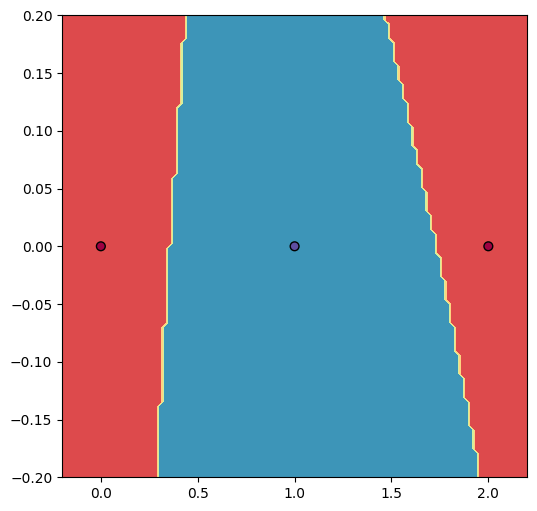

In [53]:
X_mini = np.array([
    [0, 0],
    [1, 0],
    [2, 0]
], dtype=float)
y_mini = np.array([0, 1, 0])

nn_mini = TwoLayerNeuralNetwork(2, 10, 2, Sigmoid(), 0)
grad_check(nn_mini, X_mini, y_mini)
train(nn_mini, X_mini, y_mini, 10, 5, optimizer=ADAM(nn_mini, 0.1))
plot_2d_classifier(X_mini, y_mini, nn_mini.classify)

## Hyperparams on Eric's tiny data

### Good, this works

Epoch 0:
Train Loss = 0.7516164209945291
Train Accuracy = 0.5
Epoch 5:
Train Loss = 0.7299058955263904
Train Accuracy = 0.25
Epoch 10:
Train Loss = 0.7125592327792014
Train Accuracy = 0.25
Epoch 15:
Train Loss = 0.7043929443460039
Train Accuracy = 0.75
Epoch 20:
Train Loss = 0.6959269811664885
Train Accuracy = 0.25
Epoch 25:
Train Loss = 0.6930609610763538
Train Accuracy = 0.5
Epoch 30:
Train Loss = 0.6907935105551968
Train Accuracy = 0.75
Epoch 35:
Train Loss = 0.6892559742999601
Train Accuracy = 0.75
Epoch 40:
Train Loss = 0.6874918666998682
Train Accuracy = 0.25
Epoch 45:
Train Loss = 0.6847628604638407
Train Accuracy = 0.5
Epoch 50:
Train Loss = 0.6812745567218947
Train Accuracy = 0.75
Epoch 55:
Train Loss = 0.6765734264045146
Train Accuracy = 0.75
Epoch 60:
Train Loss = 0.6707299957094778
Train Accuracy = 0.75
Epoch 65:
Train Loss = 0.6635546755508819
Train Accuracy = 0.75
Epoch 70:
Train Loss = 0.6565374466890461
Train Accuracy = 1.0
Epoch 75:
Train Loss = 0.6527879995841945
Trai

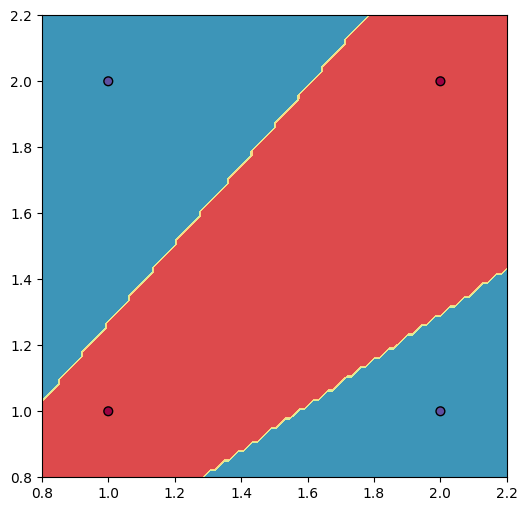

In [54]:
nn_tiny =  TwoLayerNeuralNetwork(2, 20, 2, ReLu(), 0)
train(nn_tiny, X_tiny, y_tiny, 100, 5, optimizer=ADAM(nn_tiny, 0.001))
plot_2d_classifier(X_tiny, y_tiny, nn_tiny.classify)

### Sometimes fine

different results on different runs

Epoch 0:
Train Loss = 2.822899512633729
Train Accuracy = 0.5
Epoch 5:
Train Loss = 2.5532065594304827
Train Accuracy = 0.5
Epoch 10:
Train Loss = 2.313638398729218
Train Accuracy = 0.5
Epoch 15:
Train Loss = 2.162932701098134
Train Accuracy = 0.25
Epoch 20:
Train Loss = 2.038705891022677
Train Accuracy = 0.5
Epoch 25:
Train Loss = 1.924697598373377
Train Accuracy = 0.5
Epoch 30:
Train Loss = 1.8263485661746652
Train Accuracy = 0.5
Epoch 35:
Train Loss = 1.741457215221297
Train Accuracy = 0.5
Epoch 40:
Train Loss = 1.6691724392104832
Train Accuracy = 0.5
Epoch 45:
Train Loss = 1.607469461422732
Train Accuracy = 0.5
Epoch 50:
Train Loss = 1.551732446200363
Train Accuracy = 0.75
Epoch 55:
Train Loss = 1.50268748845734
Train Accuracy = 0.75
Epoch 60:
Train Loss = 1.4582788781764453
Train Accuracy = 0.75
Epoch 65:
Train Loss = 1.417881224388054
Train Accuracy = 0.75
Epoch 70:
Train Loss = 1.3813603329685131
Train Accuracy = 0.75
Epoch 75:
Train Loss = 1.3478494218080372
Train Accuracy = 0.7

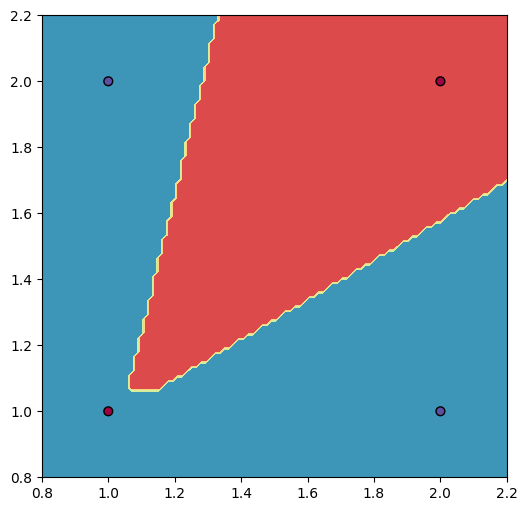

In [55]:
nn_tiny =  TwoLayerNeuralNetwork(2, 20, 2, ReLu(), 0.1)
train(nn_tiny, X_tiny, y_tiny, 100, 5, optimizer=ADAM(nn_tiny, 0.001))
plot_2d_classifier(X_tiny, y_tiny, nn_tiny.classify)

### Oh no...
back to square 1...

Epoch 0:
Train Loss = 2.792633884160888
Train Accuracy = 0.5
Epoch 5:
Train Loss = 2.790397462960292
Train Accuracy = 0.5
Epoch 10:
Train Loss = 2.7874155449826747
Train Accuracy = 0.5
Epoch 15:
Train Loss = 2.784368688720935
Train Accuracy = 0.5
Epoch 20:
Train Loss = 2.781446489327976
Train Accuracy = 0.5
Epoch 25:
Train Loss = 2.7787043143009162
Train Accuracy = 0.5
Epoch 30:
Train Loss = 2.7761483392302
Train Accuracy = 0.5
Epoch 35:
Train Loss = 2.7737664605313883
Train Accuracy = 0.5
Epoch 40:
Train Loss = 2.771540846646364
Train Accuracy = 0.75
Epoch 45:
Train Loss = 2.7694531193680216
Train Accuracy = 0.75
Epoch 50:
Train Loss = 2.7674863660095768
Train Accuracy = 0.75
Epoch 55:
Train Loss = 2.765625763821096
Train Accuracy = 0.75
Epoch 60:
Train Loss = 2.763858611738752
Train Accuracy = 0.75
Epoch 65:
Train Loss = 2.7621741310310526
Train Accuracy = 0.75
Epoch 70:
Train Loss = 2.760563197772903
Train Accuracy = 0.75
Epoch 75:
Train Loss = 2.7590180773387405
Train Accuracy = 0.

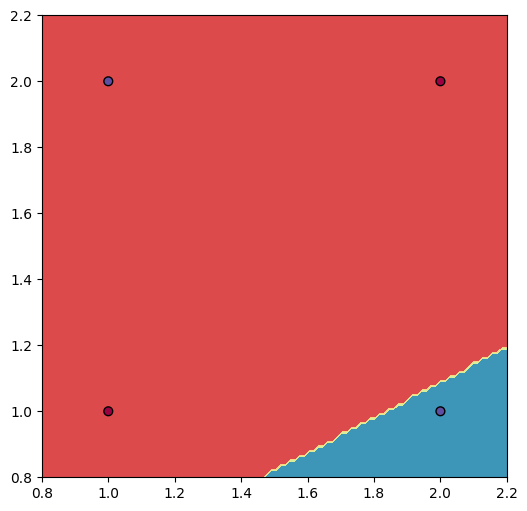

In [56]:
nn_tiny =  TwoLayerNeuralNetwork(2, 20, 2, ReLu(), 0.1)
train(nn_tiny, X_tiny, y_tiny, 100, 5, optimizer=ADAM(nn_tiny, 0.00001))
plot_2d_classifier(X_tiny, y_tiny, nn_tiny.classify)

## Hyperparams on Real Data

### ReLu
lots of peicewise linear bits, makes sense

Epoch 0:
Train Loss = 1.1968363083385654
Train Accuracy = 0.30333333333333334
Epoch 100:
Train Loss = 0.4117739617646395
Train Accuracy = 0.9033333333333333
Epoch 200:
Train Loss = 0.3328524805585935
Train Accuracy = 0.91
Epoch 300:
Train Loss = 0.31837264862494585
Train Accuracy = 0.9133333333333333
Epoch 400:
Train Loss = 0.3098518944127839
Train Accuracy = 0.92
Epoch 500:
Train Loss = 0.3056083671717579
Train Accuracy = 0.9166666666666666
Epoch 600:
Train Loss = 0.2940024101593661
Train Accuracy = 0.9266666666666666
Epoch 700:
Train Loss = 0.28789114671069266
Train Accuracy = 0.9233333333333333
Epoch 800:
Train Loss = 0.28448408671288855
Train Accuracy = 0.9233333333333333
Epoch 900:
Train Loss = 0.2813732344953384
Train Accuracy = 0.9233333333333333


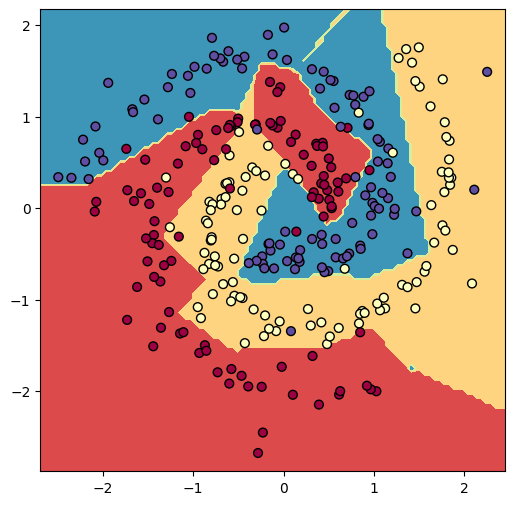

In [57]:
nn_spiral_overfit =  TwoLayerNeuralNetwork(2, 10, 3, ReLu(), 0)
X_spiral2 = X_spiral/np.std(X_spiral)
train(nn_spiral_overfit, X_spiral2, y_spiral, 1000, 100, optimizer=ADAM(nn_spiral_overfit, 0.01))
plot_2d_classifier(X_spiral2, y_spiral, nn_spiral_overfit.classify)

### Sigmoid
curvy, makes sense

Epoch 0:
Train Loss = 1.1352123421554803
Train Accuracy = 0.30333333333333334
Epoch 100:
Train Loss = 0.3812209081187684
Train Accuracy = 0.9
Epoch 200:
Train Loss = 0.2697600502181267
Train Accuracy = 0.9233333333333333
Epoch 300:
Train Loss = 0.23916660921388094
Train Accuracy = 0.9333333333333333
Epoch 400:
Train Loss = 0.22350853416077976
Train Accuracy = 0.94
Epoch 500:
Train Loss = 0.21466684966627828
Train Accuracy = 0.94
Epoch 600:
Train Loss = 0.2032649357781703
Train Accuracy = 0.9433333333333334
Epoch 700:
Train Loss = 0.1991990839187847
Train Accuracy = 0.9433333333333334
Epoch 800:
Train Loss = 0.19684436837574873
Train Accuracy = 0.9433333333333334
Epoch 900:
Train Loss = 0.19503707880686239
Train Accuracy = 0.9433333333333334


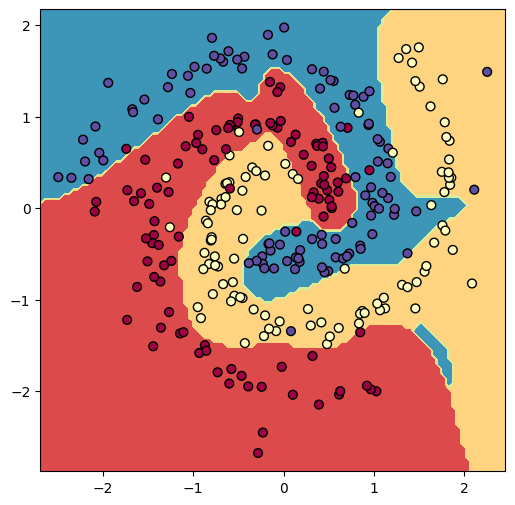

In [58]:
nn_spiral =  TwoLayerNeuralNetwork(2, 10, 3, Sigmoid(), 0)
X_spiral2 = X_spiral/np.std(X_spiral)
train(nn_spiral, X_spiral2, y_spiral, 1000, 100, optimizer=ADAM(nn_spiral, 0.01))
plot_2d_classifier(X_spiral2, y_spiral, nn_spiral.classify)

## Mnist & Cifar

### Code:

In [59]:
def train_test_split(*arrays, rng_seed = 16, percent_train = 0.8):
    rng = np.random.default_rng(seed=rng_seed)
    l = rng.permutation(len(arrays[0]))
    return [(i[l[:int(percent_train*len(i))]], i[l[int(percent_train*len(i)):]]) for i in arrays]

def lode(p):
    with open(p, "rb") as g:
        return pickle.load(g)

In [60]:
from keras.datasets import mnist, cifar10
(train_X_mnist, train_y_mnist), (test_X_mnist, test_y_mnist) = mnist.load_data()
(train_X_cifar, train_y_cifar), (test_X_cifar, test_y_cifar) = cifar10.load_data()

train_X_mnist = train_X_mnist.reshape((train_X_mnist.shape[0], 28*28))
test_X_mnist = test_X_mnist.reshape((test_X_mnist.shape[0], 28*28))
(train_X_mnist, val_X_mnist), (train_y_mnist, val_y_mnist) = train_test_split(train_X_mnist, train_y_mnist)

train_X_cifar = train_X_cifar.reshape((train_X_cifar.shape[0], 32*32*3))
train_y_cifar = train_y_cifar.flatten()
test_X_cifar = test_X_cifar.reshape((test_X_cifar.shape[0], 32*32*3))
test_y_cifar = test_y_cifar.flatten()
(train_X_cifar, val_X_cifar), (train_y_cifar, val_y_cifar) = train_test_split(train_X_cifar, train_y_cifar)

### Mnist
95-96%

In [61]:
nn_mnist = TwoLayerNeuralNetwork(28*28, 100, 10, ReLu(), 0.01)
train(model=nn_mnist, X_train=train_X_mnist, y_train=train_y_mnist, num_epochs=30, print_every=1, batch_size=100, optimizer=ADAM(nn_mnist, 0.0005), X_val=val_X_mnist, y_val=val_y_mnist, save_path="aayan_mnist.dill")

Epoch 0:
Train Loss = 89.54669763847967
Train Accuracy = 0.13183333333333333
Val Loss = 91.13674815888537
Val Accuracy = 0.12533333333333332
Epoch 1:
Train Loss = 1.0457660576041836
Train Accuracy = 0.9011041666666667
Val Loss = 1.1345387588988838
Val Accuracy = 0.89175
Epoch 2:
Train Loss = 0.7903193979130475
Train Accuracy = 0.9336666666666666
Val Loss = 0.8849766566178731
Val Accuracy = 0.9224166666666667
Epoch 3:
Train Loss = 0.6298845587540796
Train Accuracy = 0.9466875
Val Loss = 0.7177582470847548
Val Accuracy = 0.9331666666666667
Epoch 4:
Train Loss = 0.5247448979428252
Train Accuracy = 0.9514791666666667
Val Loss = 0.6252189256599152
Val Accuracy = 0.9346666666666666
Epoch 5:
Train Loss = 0.41679765581894085
Train Accuracy = 0.9636666666666667
Val Loss = 0.5108078541284783
Val Accuracy = 0.9471666666666667
Epoch 6:
Train Loss = 0.3664551184991794
Train Accuracy = 0.9626458333333333
Val Loss = 0.4580516826494731
Val Accuracy = 0.9443333333333334
Epoch 7:
Train Loss = 0.30819766

In [62]:
np.mean(nn_mnist.classify(test_X_mnist) == test_y_mnist)

0.9588

### Cifar
45-46% ish, I'm satisfied with that

In [63]:
nn_cifar = TwoLayerNeuralNetwork(32*32*3, 1000, 10, ReLu(), 0, 256)
train(model=nn_cifar, X_train=train_X_cifar, y_train=train_y_cifar, num_epochs=20, print_every=1, batch_size=500, optimizer=ADAM(nn_cifar, 0.001), X_val=val_X_cifar, y_val=val_y_cifar, save_path="aayan_cifar.dill")

Epoch 0:
Train Loss = 2.302585093023383
Train Accuracy = 0.10145
Val Loss = 2.302585093064284
Val Accuracy = 0.0992
Epoch 1:
Train Loss = 2.432623661620259
Train Accuracy = 0.327925
Val Loss = 2.4428353172602884
Val Accuracy = 0.3311
Epoch 2:
Train Loss = 2.4635577808710454
Train Accuracy = 0.360725
Val Loss = 2.4742157944562253
Val Accuracy = 0.362
Epoch 3:
Train Loss = 2.4950985645650907
Train Accuracy = 0.375675
Val Loss = 2.5058292777742883
Val Accuracy = 0.3734
Epoch 4:
Train Loss = 2.51523713963402
Train Accuracy = 0.3887
Val Loss = 2.526517818849993
Val Accuracy = 0.3856
Epoch 5:
Train Loss = 2.5336816931695734
Train Accuracy = 0.3898
Val Loss = 2.54489727133759
Val Accuracy = 0.3854
Epoch 6:
Train Loss = 2.5572039291830095
Train Accuracy = 0.402925
Val Loss = 2.5690038292694686
Val Accuracy = 0.3948
Epoch 7:
Train Loss = 2.564604543912646
Train Accuracy = 0.41345
Val Loss = 2.576697061182479
Val Accuracy = 0.404
Epoch 8:
Train Loss = 2.5663271407397015
Train Accuracy = 0.421975

In [64]:
np.mean(nn_cifar.classify(test_X_cifar) == test_y_cifar)

0.452

### Load from file and see "best results"
Mnist: 96-97%  
Cifar: 45%

In [65]:
m1 = lode("aayan_mnist.dill")
np.mean(m1.classify(test_X_mnist) == test_y_mnist)

0.9678

In [93]:
visualize_weights(m1, 100, (28, 28))

In [66]:
m2 = lode("aayan_cifar.dill")
np.mean(m2.classify(test_X_cifar) == test_y_cifar)

0.4502

In [94]:
visualize_weights(m2, 1000, (32, 32, 3))

In [ ]:
a = np.copy(m2.W1['53'])

plt.imshow()

# Credit

https://stats.stackexchange.com/questions/275521/what-is-the-derivative-of-leaky-relu